<a href="https://colab.research.google.com/github/Siftee150/How_Many_topics/blob/master/Nematode_Biology/LDA%26SA%2Bvisual.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
 
import pandas as pd
import re
import nltk
import matplotlib
import matplotlib.pyplot as plt
from nltk.corpus import stopwords 
from nltk.stem.porter import PorterStemmer
from nltk.stem import WordNetLemmatizer
import string
from wordcloud import WordCloud
import gensim
from gensim.models import CoherenceModel, LdaModel
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('punkt')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [ ]:
rx_dict = {
    'keys': re.compile(r'Key: (?P<keys>.*)\n'),
    'medline': re.compile(r'Medline: (?P<medline>\d+)\n'),
    'authors': re.compile(r'Authors: (?P<authors>.*)\n'),
    'title': re.compile(r'Title: (?P<title>.*)'),
    'citation': re.compile(r'Citation: (?P<citation>.*)'),
    'type': re.compile(r'Type: (?P<type>.*)'),
    'genes': re.compile(r'Genes: (?P<genes>.*)'),
    'abstract': re.compile(r'Abstract: (?P<abstract>.*)'),
    'end':re.compile(r'-------------------')
    }

In [ ]:
def _findregex(line):
  for key,rx in rx_dict.items():
    match=rx.search(line)
    if match:
      return key,match
  return None,None

In [ ]:
def parse_file(filepath):
  data=[]
  keyval='-'
  medval='-'
  author_val='-'
  title_val='-'
  citation_val='-'
  type_val='-'
  genes_val='-'
  abstract_val='-'

  with open(filepath,'r') as file_object:
    line=file_object.readline()
    while line:
      key,match=_findregex(line)
      if key =='keys':
        keyval=match.group('keys')
      if key =='medline':
        medval=match.group('medline')
      if key =='authors':
        author_val=match.group('authors')
      if key =='title':
        title_val=match.group('title')
      if key =='citation':
        citation_val=match.group('citation')
      if key =='type':
        type_val=match.group('type')
      if key =='genes':
        genes_val=match.group('genes')
      if key =='abstract':
        abstract_val=match.group('abstract')
      if key=='end':
        row = {
          'Key': keyval,
          'Medline': medval,
          'Authors': author_val,
          'Title': title_val,
          'Citation': citation_val,
          'Type': type_val,
          'Genes': genes_val,
          'Abstract': abstract_val ,
          }
        data.append(row)
      line=file_object.readline()
    data=pd.DataFrame(data)
    return data

In [ ]:
Finaldata=parse_file('/content/textfile.txt')
print(Finaldata.head(1))

    Key Medline  ... Genes                                           Abstract
0     3       -  ...     -  Applying a series of techniques intended to in...

[1 rows x 8 columns]


In [ ]:
 
def remove_punct(text):
  return text.translate(str.maketrans('', '', string.punctuation))
def remove_stopword(text):
  STOPWORD = set(stopwords.words('english'))
  return " ".join([word for word in str(text).split() if word not in STOPWORD])
lemmatise = WordNetLemmatizer()
def lemmatize_word(text):
    return " ".join([lemmatise.lemmatize(word) for word in text.split()])
ps = PorterStemmer()
def stem_doc(text):
    return " ".join([ps.stem(word) for word in text.split()])

In [ ]:
Finaldata["Title_cleaned"]=Finaldata["Title"].str.lower()
Finaldata["Title_cleaned"]=Finaldata["Title_cleaned"].apply(lambda text:remove_punct(text))
Finaldata["Title_cleaned"]=Finaldata["Title_cleaned"].apply(lambda text:remove_stopword(text))
Finaldata["Title_cleaned"]=Finaldata["Title_cleaned"].apply(lambda text:lemmatize_word(text))
Finaldata["Title_cleaned"]=Finaldata["Title_cleaned"].apply(lambda text:stem_doc(text))
Finaldata.head()

,Key,Medline,Authors,Title,Citation,Type,Genes,Abstract,Title_cleaned
0,3,-,Abdulkader N;Brun JL,"Induction, detection and isolation of temperat...",Revue de Nematologie 1: 27-37 1978,ARTICLE,-,Applying a series of techniques intended to in...,induct detect isol temperaturesensit
1,5,-,Abi-Rached M;Brun JL,Etude ultrastructurale des relations entre ovo...,Nematologica 21: 151-162 1975,ARTICLE,-,"Before diakinesis, the development of the oocy...",etud ultrastructural de relat entr ovocyt et
2,6,-,Abi-Rached M;Brun JL,Ultrastructural changes in the nuclear and per...,Revue de Nematologie 1: 63-72 1978,ARTICLE,-,Electron microscope studies in and around the ...,ultrastructur chang nuclear perinuclear
3,7,-,Abi-Rached M;Brun JL,Changes in the synaptonemal complex in the ooc...,C.R. des Seances de l'Academie des Sciences Se...,ARTICLE,-,During oogenesis in the hermaphroditic nematod...,chang synaptonem complex oocyt nucleu
4,8,78127686,Albertson DG;Sulston JE;White JG,Cell cycling and DNA replication in a mutant b...,Developmental Biology 63: 165-178 1978,ARTICLE,lin-5 nuc-1,The postembryonic development of the nematode,cell cycl dna replic mutant block


In [ ]:
Finaldata=Finaldata.drop(['Citation', 'Genes', 'Type'],axis=1)

In [ ]:
Finaldata["Abstract_cleaned"]=Finaldata["Abstract"].str.lower()
Finaldata["Abstract_cleaned"]=Finaldata["Abstract_cleaned"].apply(lambda text:remove_punct(text))
Finaldata["Abstract_cleaned"]=Finaldata["Abstract_cleaned"].apply(lambda text:remove_stopword(text))
Finaldata["Abstract_cleaned"]=Finaldata["Abstract_cleaned"].apply(lambda text:lemmatize_word(text))
Finaldata["Abstract_cleaned"]=Finaldata["Abstract_cleaned"].apply(lambda text:stem_doc(text))
Finaldata.head()

,Key,Medline,Authors,Title,Abstract,Title_cleaned,Abstract_cleaned
0,3,-,Abdulkader N;Brun JL,"Induction, detection and isolation of temperat...",Applying a series of techniques intended to in...,induct detect isol temperaturesensit,appli seri techniqu intend induc detect
1,5,-,Abi-Rached M;Brun JL,Etude ultrastructurale des relations entre ovo...,"Before diakinesis, the development of the oocy...",etud ultrastructural de relat entr ovocyt et,diakinesi develop oocyt c
2,6,-,Abi-Rached M;Brun JL,Ultrastructural changes in the nuclear and per...,Electron microscope studies in and around the ...,ultrastructur chang nuclear perinuclear,electron microscop studi around nucleu c
3,7,-,Abi-Rached M;Brun JL,Changes in the synaptonemal complex in the ooc...,During oogenesis in the hermaphroditic nematod...,chang synaptonem complex oocyt nucleu,oogenesi hermaphrodit nematod c elegan
4,8,78127686,Albertson DG;Sulston JE;White JG,Cell cycling and DNA replication in a mutant b...,The postembryonic development of the nematode,cell cycl dna replic mutant block,postembryon develop nematod


In [ ]:
Finaldata["FinalText"]=Finaldata["Title_cleaned"]+" "+Finaldata["Abstract_cleaned"]
Finaldata["FinalText"]=Finaldata["FinalText"].apply(lambda text:nltk.word_tokenize(text))
Finaldata["FinalText"]

0       [induct, detect, isol, temperaturesensit, appl...
1       [etud, ultrastructural, de, relat, entr, ovocy...
2       [ultrastructur, chang, nuclear, perinuclear, e...
3       [chang, synaptonem, complex, oocyt, nucleu, oo...
4       [cell, cycl, dna, replic, mutant, block, poste...
                              ...                        
6210    [latrophilin, requir, toxic, black, widow, spi...
6211    [abc, transport, gene, famili, caenorhabd, ele...
6212    [squeez, egg, worm, c, elegan, embryon, review...
6213    [centrosom, biolog, sassi, centriol, cell, cyc...
6214    [role, calponin, gene, profil, metastat, metas...
Name: FinalText, Length: 6215, dtype: object

In [ ]:
Finaldata.head()

,Key,Medline,Authors,Title,Abstract,Title_cleaned,Abstract_cleaned,FinalText
0,3,-,Abdulkader N;Brun JL,"Induction, detection and isolation of temperat...",Applying a series of techniques intended to in...,induct detect isol temperaturesensit,appli seri techniqu intend induc detect,"[induct, detect, isol, temperaturesensit, appl..."
1,5,-,Abi-Rached M;Brun JL,Etude ultrastructurale des relations entre ovo...,"Before diakinesis, the development of the oocy...",etud ultrastructural de relat entr ovocyt et,diakinesi develop oocyt c,"[etud, ultrastructural, de, relat, entr, ovocy..."
2,6,-,Abi-Rached M;Brun JL,Ultrastructural changes in the nuclear and per...,Electron microscope studies in and around the ...,ultrastructur chang nuclear perinuclear,electron microscop studi around nucleu c,"[ultrastructur, chang, nuclear, perinuclear, e..."
3,7,-,Abi-Rached M;Brun JL,Changes in the synaptonemal complex in the ooc...,During oogenesis in the hermaphroditic nematod...,chang synaptonem complex oocyt nucleu,oogenesi hermaphrodit nematod c elegan,"[chang, synaptonem, complex, oocyt, nucleu, oo..."
4,8,78127686,Albertson DG;Sulston JE;White JG,Cell cycling and DNA replication in a mutant b...,The postembryonic development of the nematode,cell cycl dna replic mutant block,postembryon develop nematod,"[cell, cycl, dna, replic, mutant, block, poste..."


In [ ]:
total_word_count={}
for row in Finaldata["FinalText"]:
  for word in row:
    if word not in total_word_count.keys():
      total_word_count[word]=1
    else:
      total_word_count[word]+=1


In [ ]:
total_word_count
#max(total_word_count,key=total_word_count.get)

{'induct': 62,
 'detect': 26,
 'isol': 162,
 'temperaturesensit': 27,
 'appli': 7,
 'seri': 21,
 'techniqu': 35,
 'intend': 2,
 'induc': 50,
 'etud': 5,
 'ultrastructural': 1,
 'de': 38,
 'relat': 49,
 'entr': 2,
 'ovocyt': 1,
 'et': 20,
 'diakinesi': 1,
 'develop': 393,
 'oocyt': 22,
 'c': 1303,
 'ultrastructur': 25,
 'chang': 71,
 'nuclear': 87,
 'perinuclear': 1,
 'electron': 23,
 'microscop': 11,
 'studi': 308,
 'around': 9,
 'nucleu': 15,
 'synaptonem': 13,
 'complex': 114,
 'oogenesi': 8,
 'hermaphrodit': 69,
 'nematod': 1377,
 'elegan': 2997,
 'cell': 792,
 'cycl': 33,
 'dna': 180,
 'replic': 12,
 'mutant': 294,
 'block': 11,
 'postembryon': 31,
 'pharynx': 16,
 'anatomi': 8,
 'caenorhabd': 2428,
 'associ': 54,
 'coleoptera': 1,
 'speci': 73,
 'egypt': 1,
 'part': 20,
 'respons': 90,
 'dauerlarva': 4,
 'nematoda': 27,
 'larval': 26,
 'form': 75,
 'freeliv': 165,
 'critic': 37,
 'oxygen': 23,
 'tension': 2,
 'regul': 384,
 'abl': 8,
 'maintain': 13,
 'stabl': 4,
 'effect': 175,
 

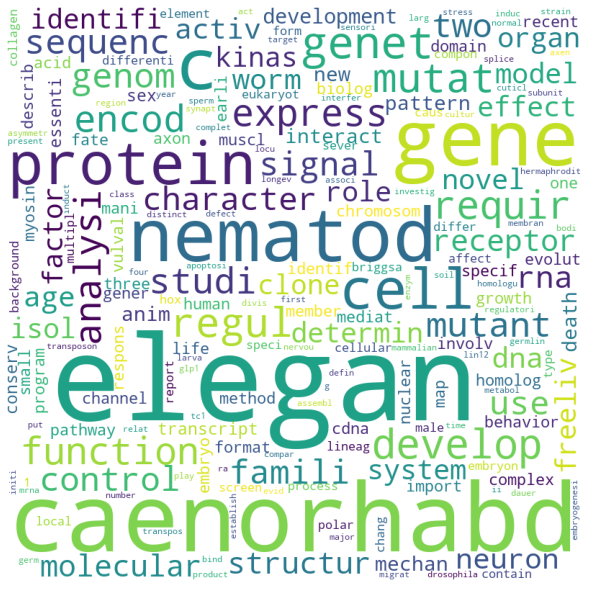

In [ ]:
wordcloud=WordCloud(width=800,height=800,background_color="white",min_font_size=10).generate_from_frequencies(total_word_count)
plt.figure(figsize = (8, 8)) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
plt.show() 

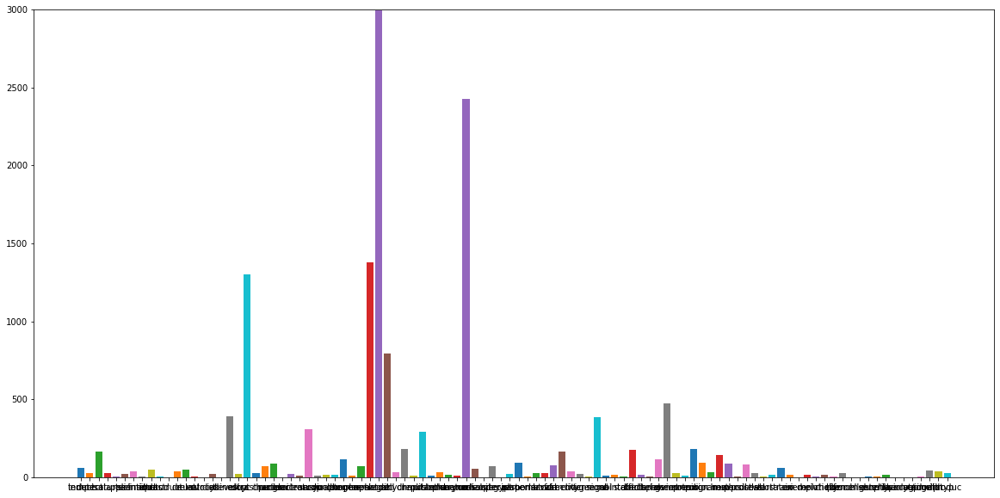

In [ ]:
lists=list(total_word_count.items())[:100]
#keys=total_word_count.keys()
#values=total_word_count.values()
plt.rcParams['figure.figsize']=(20,10)
for i in range(len(lists)):
  plt.bar(lists[i][0],lists[i][1])
plt.ylim(0,3000)
plt.show()

In [ ]:
Finaldata.to_csv('final_text.csv',index=False,header=False,
                 columns=['Key','Authors','FinalText'])

In [ ]:
#using lda algorithm on preprocessed data
dictionary=gensim.corpora.Dictionary(Finaldata["FinalText"])
#dictionary
count = 0
for k, v in dictionary.iteritems():
    print(k, v)
    count += 1
    if count > 10:
        break

0 appli
1 detect
2 induc
3 induct
4 intend
5 isol
6 seri
7 techniqu
8 temperaturesensit
9 c
10 de


In [ ]:
bow_corpus = [dictionary.doc2bow(doc) for doc in Finaldata["FinalText"]]
bow_corpus

[[(0, 1), (1, 2), (2, 1), (3, 1), (4, 1), (5, 1), (6, 1), (7, 1), (8, 1)],
 [(9, 1),
  (10, 1),
  (11, 1),
  (12, 1),
  (13, 1),
  (14, 1),
  (15, 1),
  (16, 1),
  (17, 1),
  (18, 1),
  (19, 1)],
 [(9, 1),
  (20, 1),
  (21, 1),
  (22, 1),
  (23, 1),
  (24, 1),
  (25, 1),
  (26, 1),
  (27, 1),
  (28, 1)],
 [(9, 1),
  (16, 1),
  (21, 1),
  (25, 1),
  (29, 1),
  (30, 1),
  (31, 1),
  (32, 1),
  (33, 1),
  (34, 1)],
 [(11, 1),
  (32, 1),
  (35, 1),
  (36, 1),
  (37, 1),
  (38, 1),
  (39, 1),
  (40, 1),
  (41, 1)],
 [(9, 1), (30, 2), (42, 1), (43, 1), (44, 2)],
 [(30, 1),
  (32, 1),
  (42, 1),
  (43, 1),
  (44, 1),
  (45, 1),
  (46, 1),
  (47, 1),
  (48, 1),
  (49, 1)],
 [(9, 1),
  (30, 1),
  (32, 1),
  (43, 1),
  (50, 1),
  (51, 1),
  (52, 1),
  (53, 1),
  (54, 1),
  (55, 1)],
 [(9, 1),
  (30, 1),
  (56, 1),
  (57, 1),
  (58, 1),
  (59, 2),
  (60, 1),
  (61, 1),
  (62, 1)],
 [(9, 1), (30, 2), (43, 1), (63, 1), (64, 1), (65, 2), (66, 1)],
 [(11, 1),
  (27, 1),
  (32, 1),
  (39, 1),
  (67, 1

In [ ]:
bow_doc_4972 = bow_corpus[4972]
for i in range(len(bow_doc_4972)):
    print("Word {} (\"{}\") appears {} time.".format(bow_doc_4972[i][0],dictionary[bow_doc_4972[i][0]],bow_doc_4972[i][1]))

Word 9 ("c") appears 1 time.
Word 30 ("elegan") appears 1 time.
Word 60 ("regul") appears 1 time.
Word 561 ("chromosom") appears 2 time.
Word 587 ("gene") appears 1 time.
Word 1014 ("promot") appears 1 time.
Word 1124 ("segreg") appears 1 time.
Word 1370 ("xchromosom") appears 1 time.
Word 1411 ("mitot") appears 1 time.
Word 6552 ("condensin") appears 1 time.


In [ ]:
lda_model =  gensim.models.LdaMulticore(bow_corpus, 
                                   num_topics = 10, 
                                   id2word = dictionary,                                    
                                   passes = 10,
                                   workers = 2)

In [ ]:
for idx, topic in lda_model.print_topics(-1):
    print('Topic: {} \nWords: {}'.format(idx, topic))

Topic: 0 
Words: 0.049*"elegan" + 0.042*"caenorhabd" + 0.027*"gene" + 0.015*"c" + 0.015*"signal" + 0.014*"regul" + 0.012*"nematod" + 0.010*"protein" + 0.008*"role" + 0.008*"develop"
Topic: 1 
Words: 0.031*"genom" + 0.031*"sequenc" + 0.029*"nematod" + 0.028*"caenorhabd" + 0.023*"elegan" + 0.013*"clone" + 0.010*"character" + 0.010*"complet" + 0.009*"studi" + 0.009*"cdna"
Topic: 2 
Words: 0.038*"elegan" + 0.024*"caenorhabd" + 0.022*"c" + 0.019*"mutat" + 0.014*"neuron" + 0.012*"gene" + 0.011*"protein" + 0.011*"axon" + 0.010*"genet" + 0.009*"control"
Topic: 3 
Words: 0.105*"elegan" + 0.075*"caenorhabd" + 0.052*"nematod" + 0.048*"c" + 0.020*"gene" + 0.012*"mutant" + 0.007*"freeliv" + 0.007*"model" + 0.006*"encod" + 0.006*"cell"
Topic: 4 
Words: 0.039*"rna" + 0.029*"gene" + 0.014*"structur" + 0.013*"regul" + 0.012*"interfer" + 0.011*"rnai" + 0.010*"caenorhabd" + 0.009*"nematod" + 0.009*"elegan" + 0.009*"small"
Topic: 5 
Words: 0.049*"cell" + 0.049*"elegan" + 0.042*"caenorhabd" + 0.038*"gene" 

In [ ]:
for index, score in sorted(lda_model[bow_corpus[4972]], key=lambda tup: -1*tup[1]):
    print("\nScore: {}\t \nTopic: {}".format(score, lda_model.print_topic(index)))


Score: 0.9249876141548157	 
Topic: 0.049*"elegan" + 0.042*"caenorhabd" + 0.027*"gene" + 0.015*"c" + 0.015*"signal" + 0.014*"regul" + 0.012*"nematod" + 0.010*"protein" + 0.008*"role" + 0.008*"develop"


In [ ]:
bow_corpus[4972]

[(9, 1),
 (30, 1),
 (60, 1),
 (561, 2),
 (587, 1),
 (1014, 1),
 (1124, 1),
 (1370, 1),
 (1411, 1),
 (6552, 1)]

In [ ]:
print('\nPerplexity: ', lda_model.log_perplexity(bow_corpus)) 
coherence_model_lda = CoherenceModel(model=lda_model, texts=Finaldata["FinalText"], dictionary=dictionary, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Perplexity:  -7.539759932107133

Coherence Score:  0.22730189489672464


In [ ]:
def compute_coherence_value(dictionary, corpus, texts, start,limit,step):
    coherence_value = []
    model_list = []
    for total_topics in range(start, limit, step):
        model = LdaModel(corpus=corpus, num_topics=total_topics,id2word=dictionary,passes=10)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_value.append(coherencemodel.get_coherence())

    return model_list, coherence_value

In [ ]:
model_list, coherence_values = compute_coherence_value(dictionary=dictionary, corpus=bow_corpus, texts=Finaldata["FinalText"], start=1, limit=101, step=5)
coherence_values

/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1023: RuntimeWarning: divide by zero encountered in log
  diff = np.log(self.expElogbeta)


[0.09014559027729069,
 0.2816434830644234,
 0.35620864543703523,
 0.3801175770988312,
 0.4016118807346206,
 0.4572344929082123,
 0.45609249895931087,
 0.4386700075973588,
 0.4603772194601343,
 0.4863207644150253,
 0.4667644409108971,
 0.46604333196267245,
 0.4761334069480474,
 0.4935260805197791,
 0.497030889552706,
 0.4874333412548088,
 0.48565781472161507,
 0.5467536012545945,
 0.520975306309967,
 0.5293623412734085]

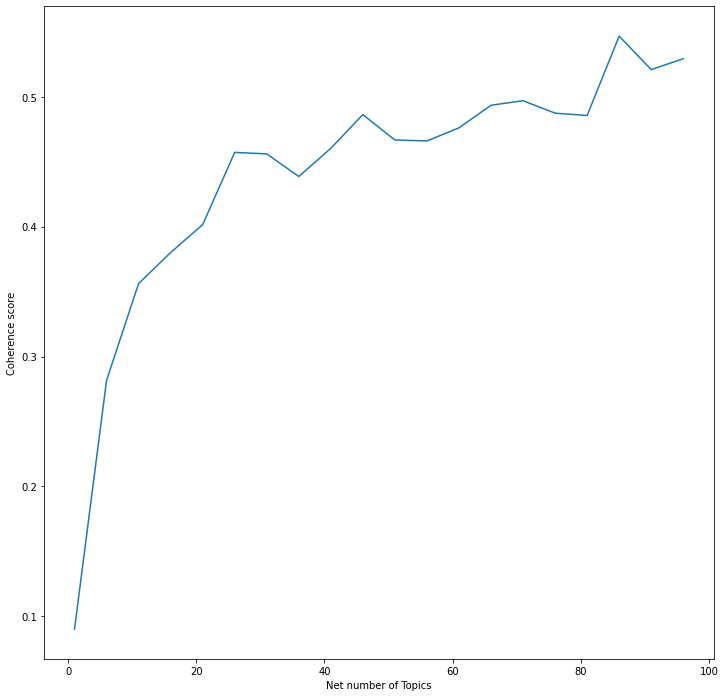

In [ ]:
limit=101; start=1; step=5;
x = range(start, limit, step)
plt.figure(figsize=(12,12))
plt.plot(x, coherence_values)
plt.xlabel("Net number of Topics")
plt.ylabel("Coherence score")
plt.show()

In [ ]:
for notopics, cv in zip(x, coherence_values):
    print("Num Topics =", notopics, " has Coherence Value of", round(cv, 4))

Num Topics = 1  has Coherence Value of 0.0901
Num Topics = 6  has Coherence Value of 0.2816
Num Topics = 11  has Coherence Value of 0.3562
Num Topics = 16  has Coherence Value of 0.3801
Num Topics = 21  has Coherence Value of 0.4016
Num Topics = 26  has Coherence Value of 0.4572
Num Topics = 31  has Coherence Value of 0.4561
Num Topics = 36  has Coherence Value of 0.4387
Num Topics = 41  has Coherence Value of 0.4604
Num Topics = 46  has Coherence Value of 0.4863
Num Topics = 51  has Coherence Value of 0.4668
Num Topics = 56  has Coherence Value of 0.466
Num Topics = 61  has Coherence Value of 0.4761
Num Topics = 66  has Coherence Value of 0.4935
Num Topics = 71  has Coherence Value of 0.497
Num Topics = 76  has Coherence Value of 0.4874
Num Topics = 81  has Coherence Value of 0.4857
Num Topics = 86  has Coherence Value of 0.5468
Num Topics = 91  has Coherence Value of 0.521
Num Topics = 96  has Coherence Value of 0.5294
Num Topics = 1  has Coherence Value of 0.0901
Num Topics = 6  has

In [ ]:
optimal_model = model_list[18]
for idx, topic in optimal_model.print_topics(-1):
    print('Topic: {} \nWords: {}'.format(idx, topic))

Topic: 0 
Words: 0.484*"genom" + 0.086*"compar" + 0.081*"caenorhabd" + 0.056*"elegan" + 0.055*"complet" + 0.035*"nematod" + 0.020*"project" + 0.014*"gene" + 0.013*"c" + 0.012*"par"
Topic: 1 
Words: 0.185*"enzym" + 0.163*"finger" + 0.064*"publish" + 0.058*"loss" + 0.040*"content" + 0.039*"adapt" + 0.035*"tube" + 0.033*"aberr" + 0.033*"label" + 0.028*"vivo"
Topic: 2 
Words: 0.171*"evolut" + 0.104*"ring" + 0.093*"gene" + 0.074*"spatial" + 0.052*"concern" + 0.049*"motif" + 0.036*"throughout" + 0.035*"sexdetermin" + 0.024*"copperzinc" + 0.023*"nematod"
Topic: 3 
Words: 0.267*"essenti" + 0.127*"polar" + 0.102*"cell" + 0.036*"zygot" + 0.035*"connect" + 0.032*"proper" + 0.031*"embryon" + 0.029*"gene" + 0.029*"aspect" + 0.023*"promot"
Topic: 4 
Words: 0.111*"form" + 0.098*"longev" + 0.091*"nematod" + 0.069*"evolutionari" + 0.059*"signific" + 0.056*"speci" + 0.049*"host" + 0.044*"elegan" + 0.038*"cultur" + 0.036*"better"
Topic: 5 
Words: 0.358*"famili" + 0.088*"member" + 0.082*"cellular" + 0.057

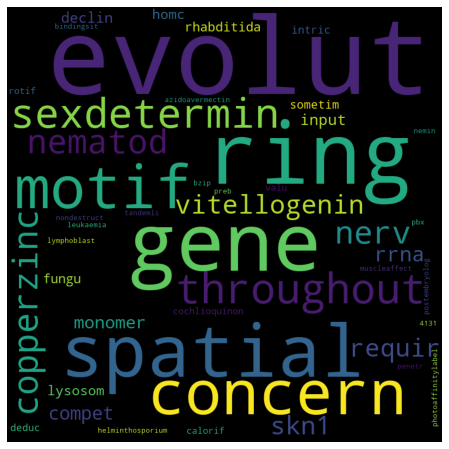

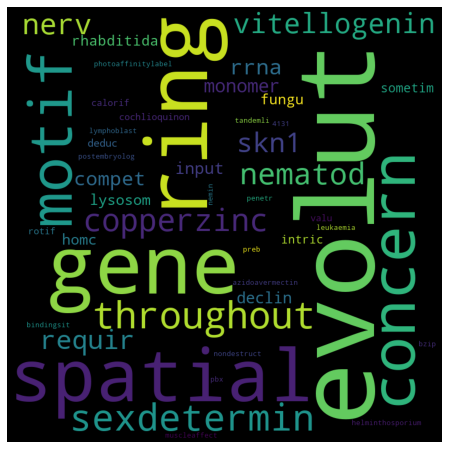

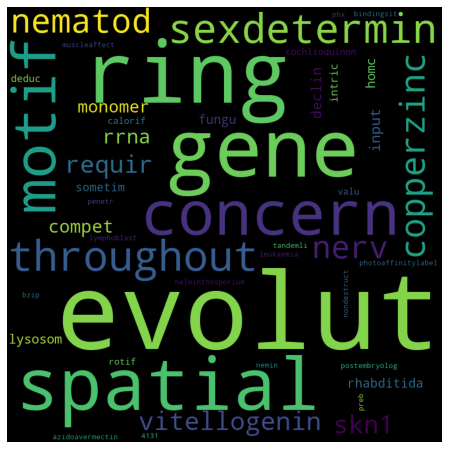

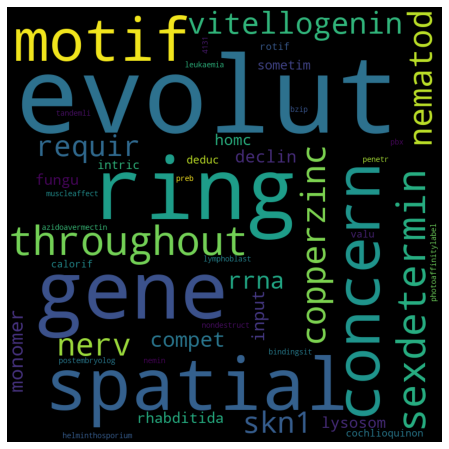

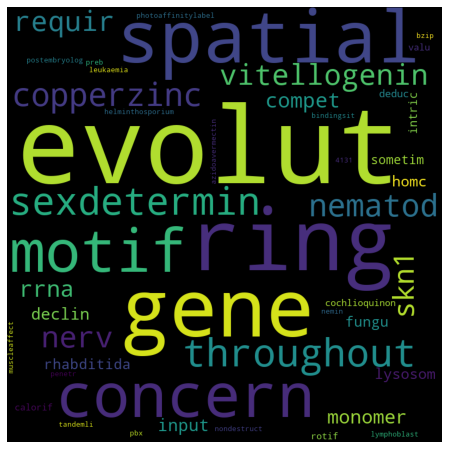

...

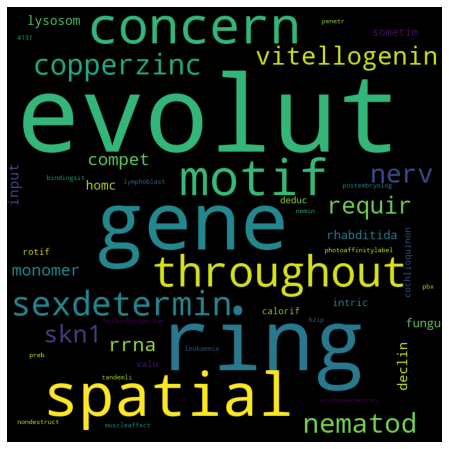

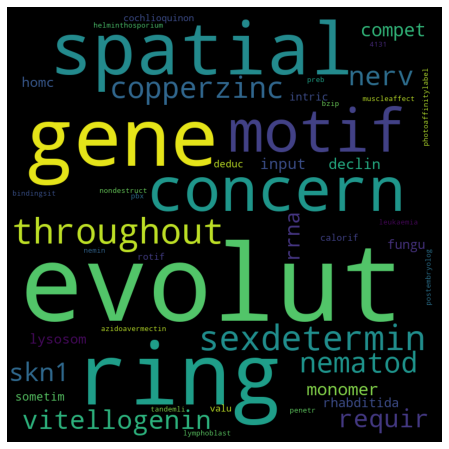

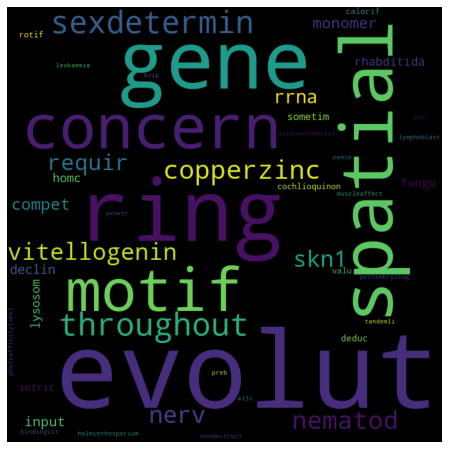

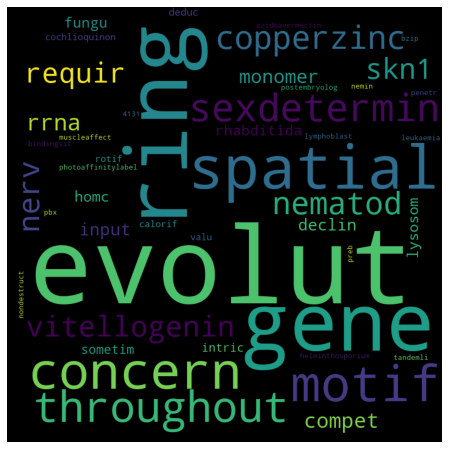

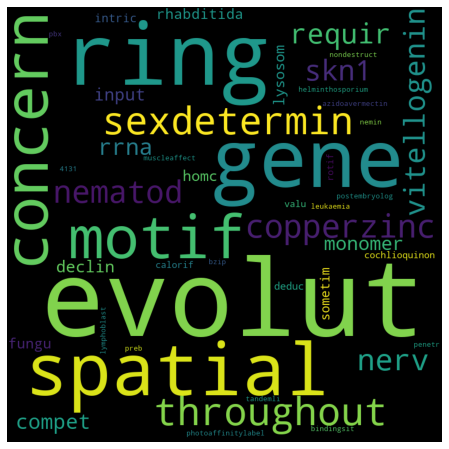

In [ ]:
for t in range(optimal_model.num_topics):
  plt.figure(figsize = (8, 8))
  wordcloud=WordCloud(width=800,height=800,background_color="black",min_font_size=10).generate_from_frequencies(dict(optimal_model.show_topic(2, 200)))
  plt.imshow(wordcloud)
  plt.axis("off")
  plt.show()
#optimal_model.show_topic(1, 200)

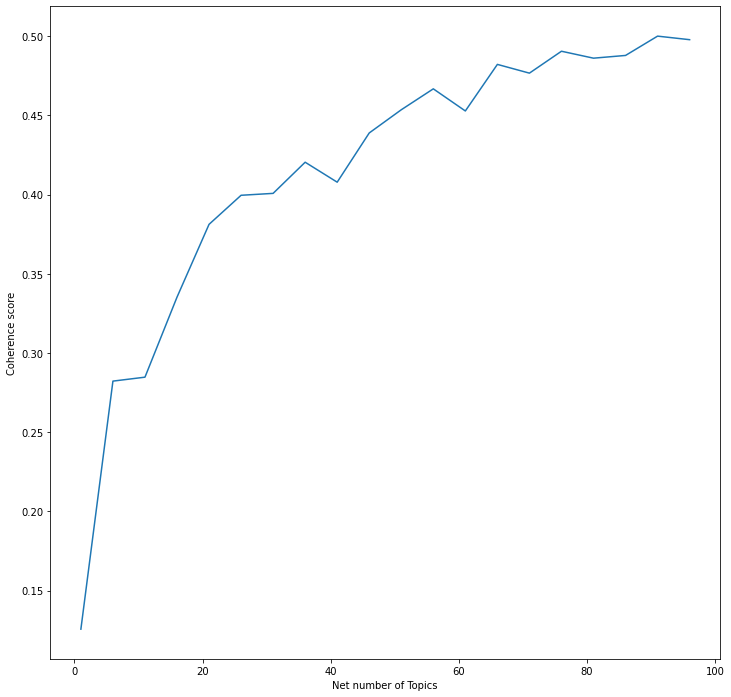

/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py:1023: RuntimeWarning: divide by zero encountered in log
  diff = np.log(self.expElogbeta)


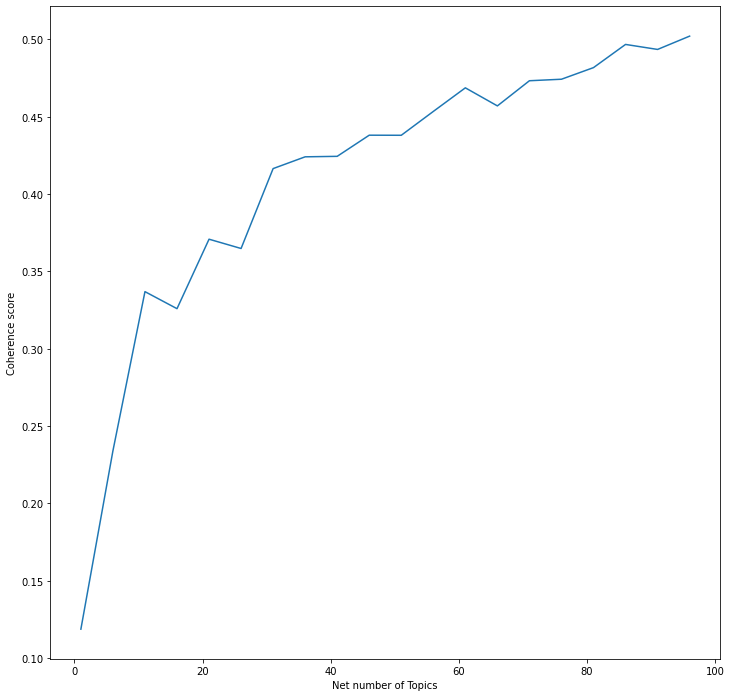

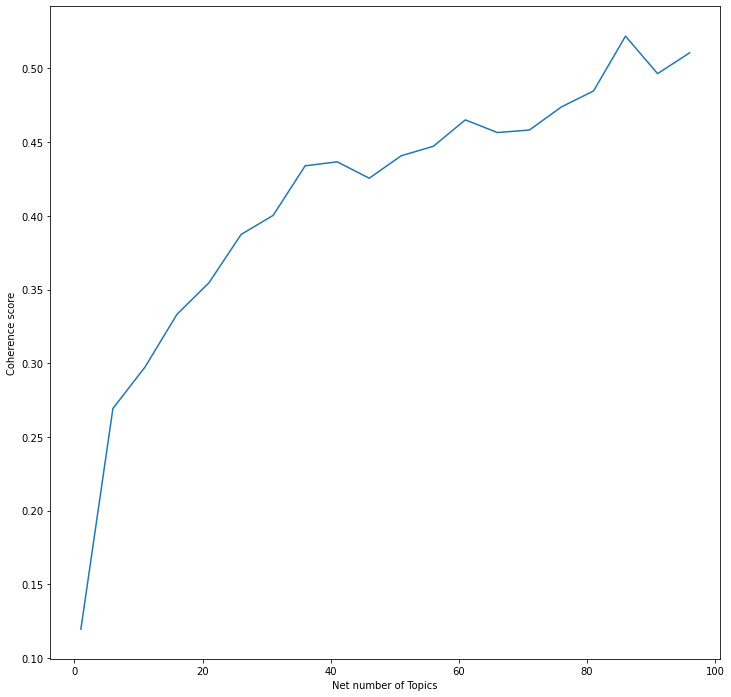

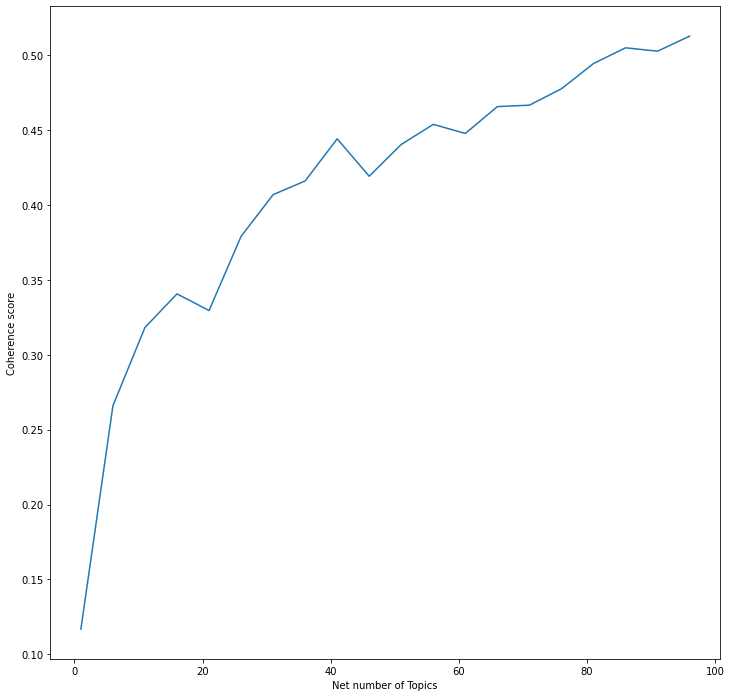

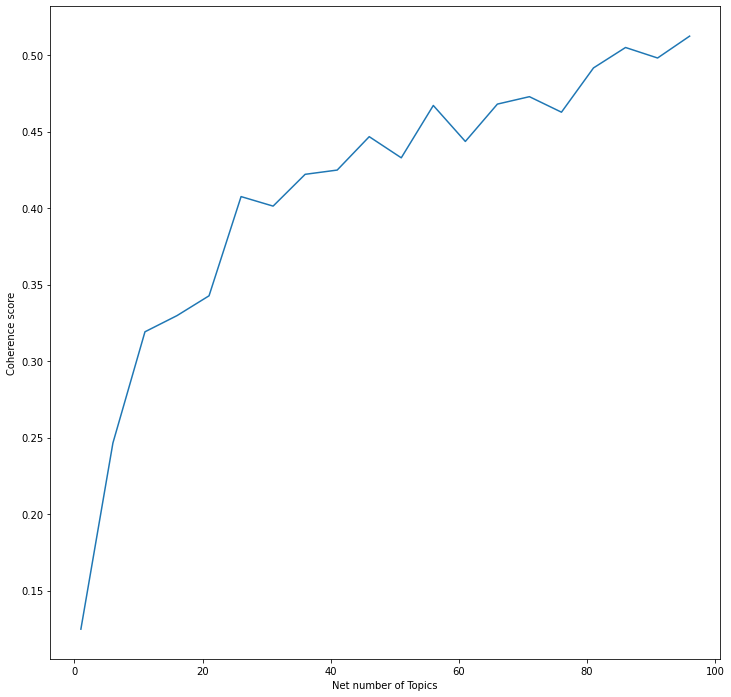

In [ ]:
subdata=[];
for i in range(0,5):
  subdata.append(Finaldata["FinalText"].sample(frac=0.8))
#for k in range(1,101,5):
for sample in subdata:
  sub_dictionary=gensim.corpora.Dictionary(sample)
  sub_bow_corpus = [sub_dictionary.doc2bow(doc) for doc in sample]
  model_list, coherence_values = compute_coherence_value(dictionary=sub_dictionary, corpus=sub_bow_corpus,texts=sample, start=1, limit=101, step=5)
  limit=101; start=1; step=5;
  x = range(start, limit, step)
  plt.figure(figsize=(12,12))
  plt.plot(x, coherence_values)
  plt.xlabel("Net number of Topics")
  plt.ylabel("Coherence score")
  plt.show()

In [ ]:
def jaccard_index(list1,list2):
  s1=set(list1);
  s2=set(list2)
  return float(len(s1.intersection(s2))) / float(len(s1.union(s2)))

In [ ]:
def hungarian method():
  

In [ ]:
def agree(S0,Sx):
  

In [ ]:
for i in range(0,51):
  subdata.append(Finaldata["FinalText"].sample(frac=0.8))
for k in range(10,20,10):
  lda_model_base =  gensim.models.LdaMulticore(bow_corpus,num_topics = 10,id2word = dictionary,passes = 10,workers = 2)
  x=lda_model_base.show_topics(num_words=10)
  S0={}
  for topic,word in x:
    S0[topic]=re.sub('[^A-Za-z ]+','',word)
  for sample in subdata:
    sub_dictionary=gensim.corpora.Dictionary(sample)
    sub_bow_corpus = [sub_dictionary.doc2bow(doc) for doc in sample]
    lda_model_sub =  gensim.models.LdaMulticore(sub_bow_corpus,num_topics = k,id2word =sub_dictionary,passes = 10,workers = 2)
    y=lda_model_base.show_topics(num_words=10)
    Sx={}
    for topic,word in x:
      Sx[topic]=re.sub('[^A-Za-z ]+','',word)
print(Sx)
print(S0)




Process ForkPoolWorker-216:
Process ForkPoolWorker-217:
Traceback (most recent call last):
Traceback (most recent call last):
  File "/usr/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
  File "/usr/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
  File "/usr/lib/python3.6/multiprocessing/process.py", line 93, in run
    self._target(*self._args, **self._kwargs)
  File "/usr/lib/python3.6/multiprocessing/pool.py", line 103, in worker
    initializer(*initargs)
  File "/usr/local/lib/python3.6/dist-packages/gensim/models/ldamulticore.py", line 333, in worker_e_step
    worker_lda.do_estep(chunk)  # TODO: auto-tune alpha?
  File "/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py", line 725, in do_estep
    gamma, sstats = self.inference(chunk, collect_sstats=True)
  File "/usr/local/lib/python3.6/dist-packages/gensim/models/ldamodel.py", line 679, in inference
    phinorm = np.dot(expElogthetad, expElogbe

KeyboardInterrupt: ignored